<a href="https://colab.research.google.com/github/muhammadmada/DL/blob/main/DL_Neural_Style_Transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Neural Style Transfer (Image-to-Image)

## Preparation

### Load necessary libraries

In [ ]:
import cv2
import imageio
import numpy as np
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

### Mount Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
root_path = 'gdrive/MyDrive/NST'

Mounted at /content/drive


## Image Insertion

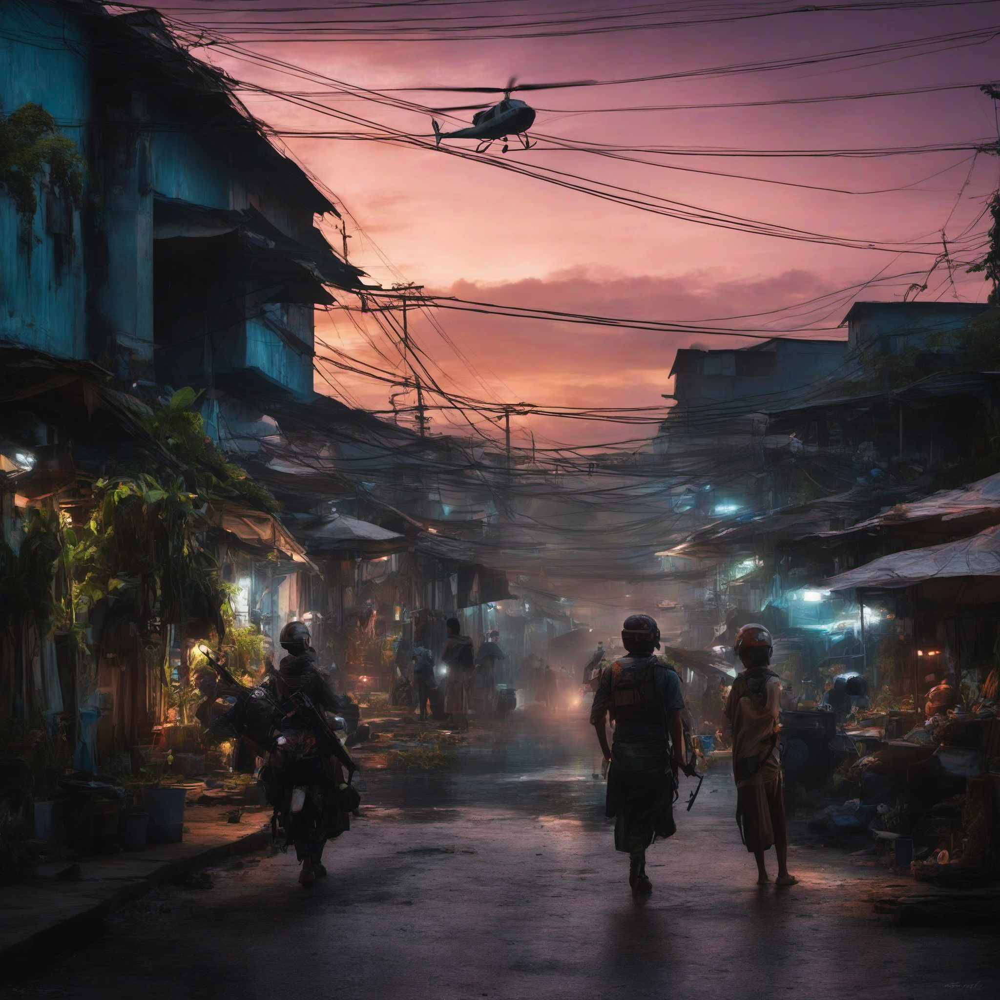

(2048, 2048, 3)

In [ ]:
image_source = cv2.imread('/content/drive/MyDrive/NST/source/source.png')
cv2_imshow(image_source)
image_source.shape

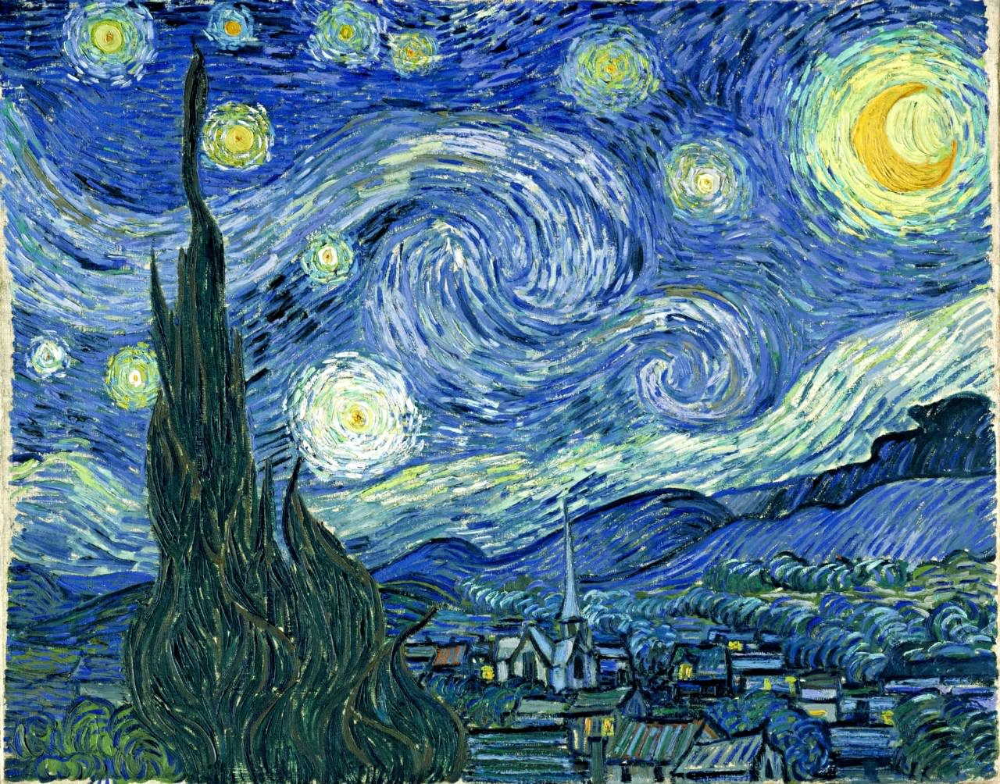

(1004, 1280, 3)

In [ ]:
image_styler = cv2.imread('/content/drive/MyDrive/NST/styler/Vincent_van_Gogh/Vincent_van_Gogh_368.jpg')
cv2_imshow(image_styler)
image_styler.shape

## NST Operation

### Load pretrained model using .keras file

In [ ]:
model = keras.models.load_model('/content/drive/MyDrive/NST/models/retrained_autoencoder-11_11_23-03_23_55-1024-256.keras')

### Style Transfer

#### Encode source image

In [ ]:
encoder = model.get_layer("encoder")
encoder.summary()

Model: "encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 encoder_input (InputLayer)  [(None, 128, 128, 3)]     0         
                                                                 
 encoder_conv_layer_1 (Conv  (None, 128, 128, 2)       56        
 2D)                                                             
                                                                 
 encoder_relu_1 (ReLU)       (None, 128, 128, 2)       0         
                                                                 
 encoder_conv_layer_2 (Conv  (None, 64, 64, 16)        816       
 2D)                                                             
                                                                 
 encoder_relu_2 (ReLU)       (None, 64, 64, 16)        0         
                                                                 
 encoder_conv_layer_3 (Conv  (None, 32, 32, 64)        2566

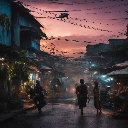

In [ ]:
image_source = cv2.resize(image_source, (128,128))
cv2_imshow(image_source)

In [ ]:
image_source.shape

(128, 128, 3)

In [ ]:
image_source = np.expand_dims(image_source, axis=0)
image_source.shape

(1, 128, 128, 3)

In [ ]:
encoded_data_source = encoder.predict(image_source)

1/1 [==============================] - 7s 7s/step


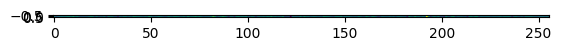

In [ ]:
from matplotlib import pyplot as plt
plt.imshow(encoded_data_source)
plt.show()

In [ ]:
print(encoded_data_source.dtype)

float32


#### Encode style image

In [ ]:
encoder = model.get_layer("encoder")
encoder.summary()

Model: "encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 encoder_input (InputLayer)  [(None, 128, 128, 3)]     0         
                                                                 
 encoder_conv_layer_1 (Conv  (None, 128, 128, 2)       56        
 2D)                                                             
                                                                 
 encoder_relu_1 (ReLU)       (None, 128, 128, 2)       0         
                                                                 
 encoder_conv_layer_2 (Conv  (None, 64, 64, 16)        816       
 2D)                                                             
                                                                 
 encoder_relu_2 (ReLU)       (None, 64, 64, 16)        0         
                                                                 
 encoder_conv_layer_3 (Conv  (None, 32, 32, 64)        2566

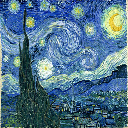

In [ ]:
image_styler = cv2.resize(image_styler, (128,128))
cv2_imshow(image_styler)

In [ ]:
image_styler.shape

(128, 128, 3)

In [ ]:
image_styler = np.expand_dims(image_styler, axis=0)
image_styler.shape

(1, 128, 128, 3)

In [ ]:
encoded_data_styler = encoder.predict(image_styler)

1/1 [==============================] - 0s 20ms/step


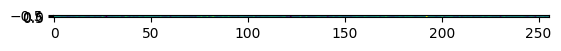

In [ ]:
from matplotlib import pyplot as plt
plt.imshow(encoded_data_styler)
plt.show()

#### Generate image

In [ ]:
decoder = model.get_layer('decoder')
decoder.summary()

Model: "decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 decoder_input (InputLayer)  [(None, 256)]             0         
                                                                 
 decoder_dense (Dense)       (None, 131072)            33685504  
                                                                 
 reshape (Reshape)           (None, 32, 32, 128)       0         
                                                                 
 decoder_conv_transpose_lay  (None, 32, 32, 128)       147584    
 er_1 (Conv2DTranspose)                                          
                                                                 
 decoder_relu_1 (ReLU)       (None, 32, 32, 128)       0         
                                                                 
 decoder_conv_transpose_lay  (None, 64, 64, 64)        204864    
 er_2 (Conv2DTranspose)                                    

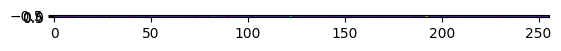

In [ ]:
latent_mix = encoded_data_source * encoded_data_styler
plt.imshow(latent_mix)

In [ ]:
generated_image = decoder.predict(latent_mix)

1/1 [==============================] - 2s 2s/step


In [ ]:
print(generated_image)
generated_image.shape

[[[[184.34941  173.71677  165.01712 ]
   [196.38602  174.35461  171.33517 ]
   [200.20053  185.72972  184.8042  ]
   ...
   [175.29909  134.90755  102.51022 ]
   [167.97926  122.98762   87.854324]
   [150.52245  115.22242   90.14337 ]]

  [[194.50645  182.12476  175.6644  ]
   [184.1279   165.60165  169.73145 ]
   [189.82889  169.42575  176.75179 ]
   ...
   [172.67624  117.85146   86.25178 ]
   [169.82275  112.87893   81.398834]
   [170.87997  123.93413   95.764046]]

  [[185.08612  172.0202   171.52716 ]
   [162.20204  148.81998  154.47731 ]
   [175.1691   157.51978  165.30188 ]
   ...
   [115.642136  58.361958  40.319145]
   [119.45604   55.7915    35.726868]
   [135.05585   83.40226   60.589302]]

  ...

  [[147.77626  142.49767  127.94043 ]
   [142.39738  138.80171  123.69843 ]
   [149.49129  145.6216   125.632904]
   ...
   [ 85.36264   80.92642   71.4201  ]
   [ 92.0897    76.234505  57.552315]
   [134.11404  103.75167   88.152306]]

  [[166.28012  160.16812  137.78667 ]
   [150

(1, 128, 128, 3)

In [ ]:
generated_image = np.squeeze(generated_image, axis = 0)
tf.keras.preprocessing.image.save_img('/content/drive/MyDrive/NST/result/stylized_image.png',generated_image)

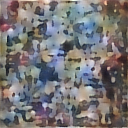

In [ ]:
cv2_imshow(cv2.imread('/content/drive/MyDrive/NST/result/stylized_image.png'))

## Test Area

In [ ]:
test = model.predict(image_styler)

1/1 [==============================] - 0s 140ms/step


In [ ]:
test = np.squeeze(test, axis = 0)
tf.keras.preprocessing.image.save_img('/content/drive/MyDrive/NST/result/test_image.png',test)

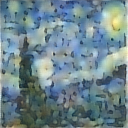

In [ ]:
cv2_imshow(cv2.imread('/content/drive/MyDrive/NST/result/test_image.png'))

In [ ]:
test02 = model.predict(image_source)

1/1 [==============================] - 0s 25ms/step


In [ ]:
test02 = np.squeeze(test02, axis = 0)
tf.keras.preprocessing.image.save_img('/content/drive/MyDrive/NST/result/test_image-02.png',test02)

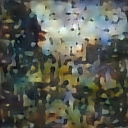

In [ ]:
cv2_imshow(cv2.imread('/content/drive/MyDrive/NST/result/test_image-02.png'))